`Цель`:

- решить задачу кластеризации для изображений

`Выводы`: 

- В ходе  работы мы кластеризовали изображения на 10 кластеров, цель достигнута 

In [1]:
import keras
from keras.datasets import fashion_mnist 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

In [2]:
(X_train,y_train), (X_test,y_test) = fashion_mnist.load_data()

In [3]:
X_train.shape #60000 изображений размера 28 x 28

(60000, 28, 28)

In [4]:
#преобрахуем X в 2D массив 
X = X_train.reshape(-1,X_train.shape[1]*X_train.shape[2]) 
X.shape

(60000, 784)

In [5]:
y = y_train

In [6]:
print ("The shape of X is " + str(X.shape))
print ("The shape of y is " + str(y.shape)) 

The shape of X is (60000, 784)
The shape of y is (60000,)


Индекс в датасете будет нашим кластером

- 0 is Tshirt
- 1 is Trouser 
- 2 is Pullover
- 3 is Dress
- 4 is Coat
- 5 is Sandal
- 6 is Shirt
- 7 is Sneaker
- 8 is Bag
- 9 is Boot

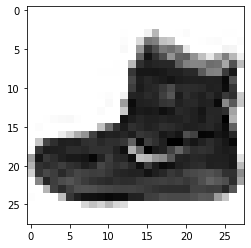

9

In [7]:
#Посмотрим на изображение  
n= 0 # от 0 до 9
plt.imshow(X[n].reshape(X_train.shape[1], X_train.shape[2]), cmap = plt.cm.binary)
plt.show()
y[n]

In [8]:
Clus_dataSet = StandardScaler().fit_transform(X) #(mean = 0 and variance = 1)

## K-means ++

Главные параметры для K-means :

- init : Метод инициализации центроидов (будет k-means++)
- n_clusters : число кластеров (у нас 10)
- n_init : сколько раз алгоритм будет запущен ( будет выбран наилучший результат)

```python
inertia = []
for k in range(5, 100):
    kmeans = KMeans(init = "k-means++",n_clusters=10, n_init = k,random_state=1).fit(Clus_dataSet)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(5, 100), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$');
```

Можно запустить код выше , если хотите проверить оптимальное n_init , но у меня он выполнялся последний раз 2 часа

In [9]:
k_means = KMeans(init = "k-means++", n_clusters = 10, n_init = 35)

In [10]:
# обучим модель 
k_means.fit(Clus_dataSet)

KMeans(n_clusters=10, n_init=35)

In [11]:
k_means_labels = k_means.labels_ #список меток
print("The list of labels of the clusters are " + str(np.unique(k_means_labels)))# уникальные

The list of labels of the clusters are [0 1 2 3 4 5 6 7 8 9]


In [12]:
G = len(np.unique(k_means_labels)) #число меток 

#2D матрица для массива индексов меток
cluster_index= [[] for i in range(G)]
for i, label in enumerate(k_means_labels,0):
    for n in range(G):
        if label == n:
            cluster_index[n].append(i)
        else:
            continue

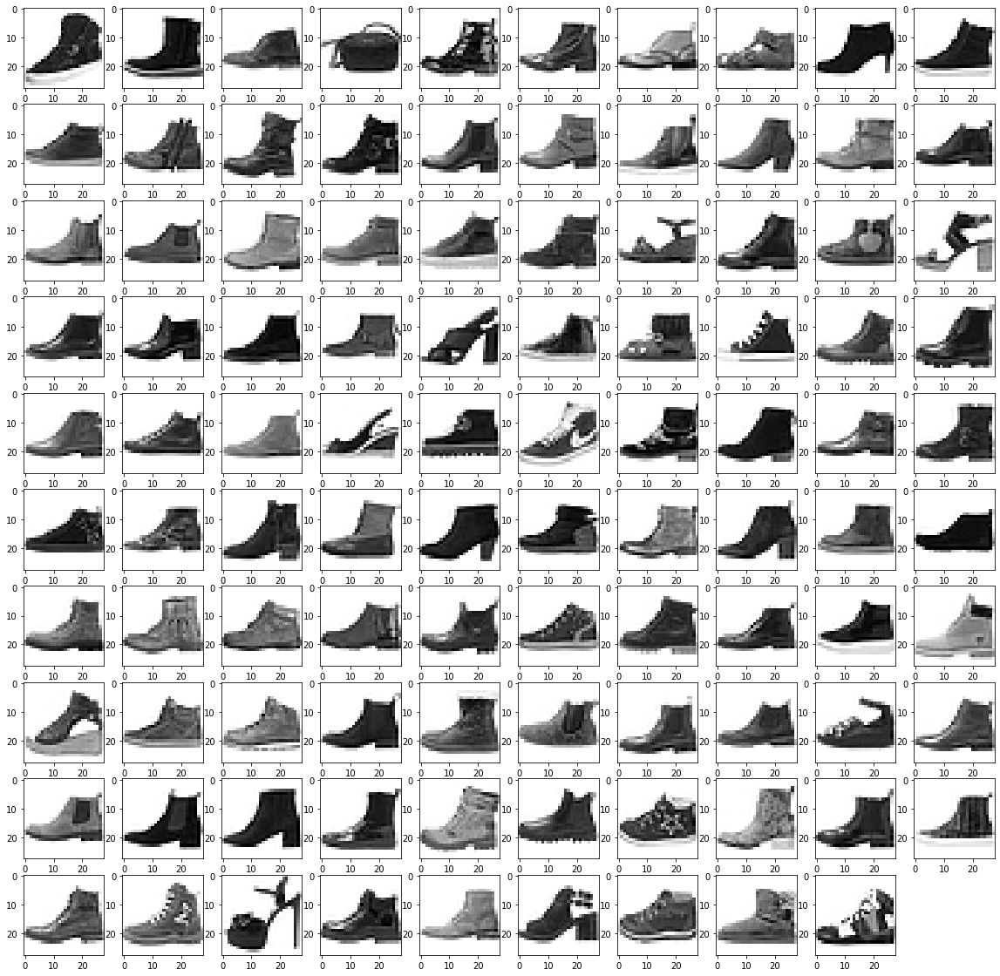

In [13]:
#Визуализация кластеров
plt.figure(figsize=(20,20));
clust = 8 #номер кластера для визуализации
num = 100 #число картинок для визуализации
for i in range(1,num): 
    plt.subplot(10, 10, i); 
    plt.imshow(X[cluster_index[clust][i+500]].reshape(X_train.shape[1], X_train.shape[2]), cmap = plt.cm.binary);
    
plt.show()

In [14]:
Y_clust = [[] for i in range(G)]
for n in range(G):
    Y_clust[n] = y[cluster_index[n]] #Y_clust [0] содержит массив "правильной" категории из y_train для cluster_index [0]
    assert(len(Y_clust[n]) == len(cluster_index[n])) # подтверждение размера

In [15]:
#считает число каждой категории для каждого кластера
def counter(cluster):
    unique, counts = np.unique(cluster, return_counts=True)
    label_index = dict(zip(unique, counts))
    return label_index

In [17]:
label_count= [[] for i in range(G)]
for n in range(G):
    label_count[n] = counter(Y_clust[n])

label_count[1] #Число элементов каждой категории в 1 кластере

{0: 1672, 1: 155, 2: 1734, 3: 665, 4: 1078, 5: 34, 6: 2091, 8: 565, 9: 52}

In [18]:
class_names = {0:'T-shirt/top', 1:'Trouser',2: 'Pullover',3: 'Dress',4: 'Coat',5:
               'Sandal',6: 'Shirt', 7:'Sneaker',8:  'Bag',9: 'Boot'} 

#функция для визуализации колличества элементов в каждой категории
def plotter(label_dict):
    plt.bar(range(len(label_dict)), list(label_dict.values()), align='center')
    a = []
    for i in [*label_dict]: a.append(class_names[i])
    plt.xticks(range(len(label_dict)), list(a), rotation=45, rotation_mode='anchor')

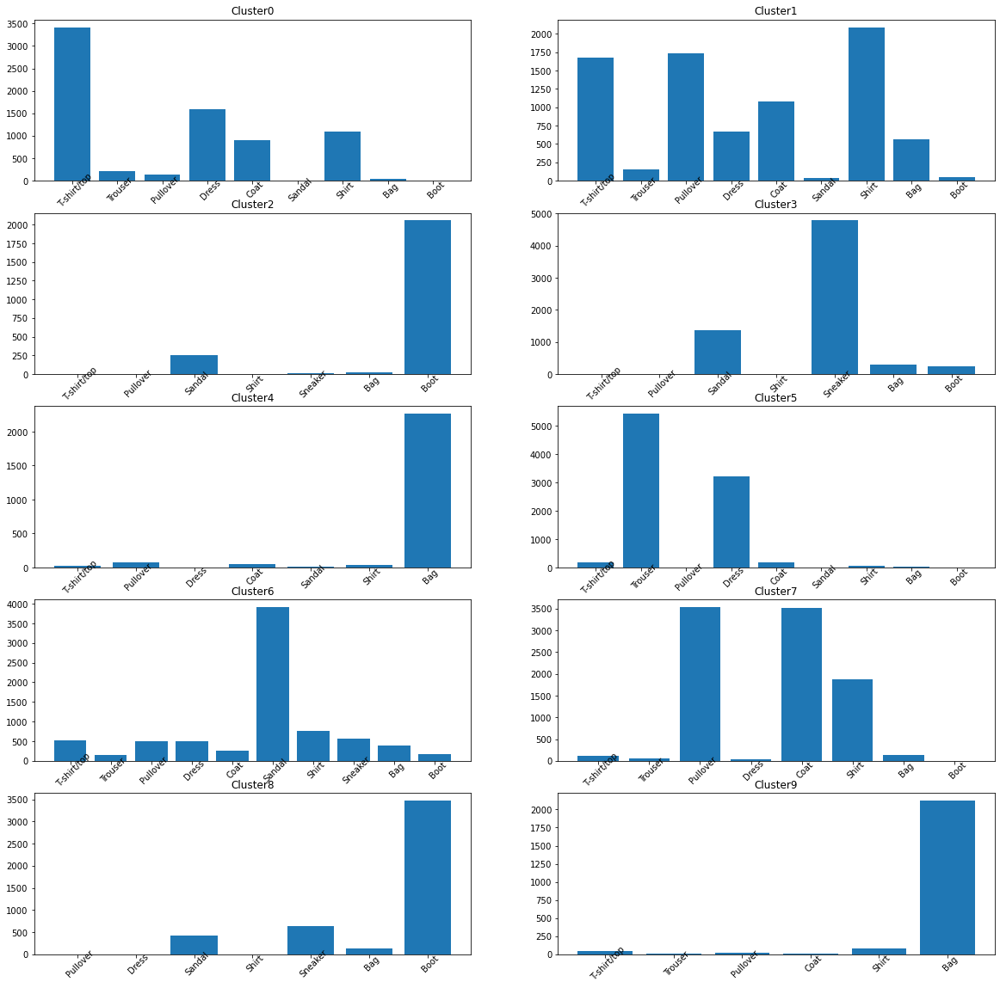

In [19]:
plt.figure(figsize=(20,20))
for i in range (1,11):
    plt.subplot(5, 2, i)
    plotter(label_count[i-1]) 
    plt.title("Cluster" + str(i-1))

In [21]:
import plotly as py
import plotly.graph_objs as go
import plotly.express as px

In [22]:
layout = go.Layout(
    title='<b>Cluster Visualisation</b>',
    yaxis=dict(
        title='<i>Y</i>'
    ),
    xaxis=dict(
        title='<i>X</i>'
    )
)

colors = ['red','green' ,'blue','purple','magenta','yellow','cyan','maroon','teal','black']
trace = [ go.Scatter3d() for _ in range(11)]
for i in range(0,10):
    my_members = (k_means_labels == i)
    index = [h for h, g in enumerate(my_members) if g]
    trace[i] = go.Scatter3d(
            x=Clus_dataSet[my_members, 0],
            y=Clus_dataSet[my_members, 1],
            z=Clus_dataSet[my_members, 2],
            mode='markers',
            marker = dict(size = 2,color = colors[i]),
            hovertext=index,
            name='Cluster'+str(i),
   
            )

fig = go.Figure(data=[trace[0],trace[1],trace[2],trace[3],trace[4],trace[5],trace[6],trace[7],trace[8],trace[9]], layout=layout)
    
py.offline.iplot(fig)

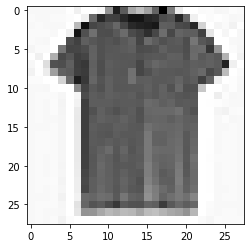

In [36]:
# если совмеситьь курсор и точку кластера , то можно увидеть значение
# записываем его в n  и получаем предмет 
n = 4879
plt.imshow(X[n].reshape(28, 28), cmap = plt.cm.binary)
plt.show()